
#                 Movies Analysis and Recommendation In NLP

### by Hui-Lin Sun

# I: Introduction

The goal of this project is to analyze a movie and recommendation in NLP. We will use NLP techniques to analyze movie descriptions and reviews contents, and also use content-based filter to recommend movies similar to a given movie.




### To see my project on GitHub: 

### Data used for this project:
   
   1. 'rotten_tomatoes_movies.csv' and 'rotten_tomatoes_critic_reviews.csv'
   
   2. The idea is to bring useful columns from 'rotten_tomatoes_critic_reviews.csv'into'rotten_tomatoes_movies.csv'
- Source: https://www.kaggle.com/datasets/stefanoleone992/rotten-tomatoes-movies-and-critic-reviews-dataset?select=rotten_tomatoes_critic_reviews.csv

### Here are the main steps in this  project:

1. Text Preprocessing:
- Tokenization: Breaking movie descriptions into words or tokens.
- Stopword Removal: Removing common words like “the”, “is”, etc.


2. Feature Extraction:
- TF-IDF (Term Frequency-Inverse Document Frequency): A method for converting text data into a numerical form, reflecting the importance of words in each movie description.


3. Similarity Measures:
- Cosine Similarity: A metric to measure the similarity between two movie descriptions based on their TF-IDF vectors.


4. Sentiment Analysis:
- Using TextBlob to analyze the sentiment of reviews contents. Positive reviews can influence recommendations by giving higher priority to movies with positive sentiment.


5. Topic Modeling (LDA - Latent Dirichlet Allocation):
- Discovering hidden topics in movie descriptions or negative reviews content to further categorize movies.

6. Word Embeddings:
- Word2Vec: Using pretrained models to convert words into high-dimensional vectors that capture semantic meanings.

# II: Data Processing and Exploratory Data Analysis (EDA)

### Import Required Libraries

In [1]:
# data processing
import pandas as pd
import numpy as np

#Viz
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud,STOPWORDS

# text processing 
import re
from textblob import TextBlob


#scikit-learn library for Tfidf,cosine_similarit,LDA
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import LatentDirichletAllocation

# Import linear_kernel to compute the dot product
from sklearn.metrics.pairwise import linear_kernel



#NLTK packages
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt') # For tokenization
nltk.download('stopwords') #For stop words

from nltk.corpus import stopwords


#gensim for topic modeling,word2vec model
!pip install -U gensim
!pip install tqdm
from tqdm import tqdm
import gensim
from gensim import corpora
from gensim.utils import simple_preprocess
from gensim.models import Word2Vec

# umap for Visualize word2vec Embeddings
!pip install umap-learn
import umap
import umap.umap_ as umap 

import random

import warnings
warnings.filterwarnings("ignore")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hsun61\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hsun61\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Load the dataset

In [2]:
# Load the dataset from 'rotten_tomatoes_movies.csv'
movie_df = pd.read_csv('rotten_tomatoes_movies.csv')

# Show the first few rows of the dataset
movie_df.head()

,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,...,production_company,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...",Though it may seem like just another Harry Pot...,PG,"Action & Adventure, Comedy, Drama, Science Fic...",Chris Columbus,"Craig Titley, Chris Columbus, Rick Riordan","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2010-02-12,...,20th Century Fox,Rotten,49.0,149.0,Spilled,53.0,254421.0,43,73,76
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Nicole Holofcener's newest might seem slight i...,R,Comedy,Nicole Holofcener,Nicole Holofcener,"Catherine Keener, Amanda Peet, Oliver Platt, R...",2010-04-30,...,Sony Pictures Classics,Certified-Fresh,87.0,142.0,Upright,64.0,11574.0,44,123,19
2,m/10,10,"A successful, middle-aged Hollywood songwriter...",Blake Edwards' bawdy comedy may not score a pe...,R,"Comedy, Romance",Blake Edwards,Blake Edwards,"Dudley Moore, Bo Derek, Julie Andrews, Robert ...",1979-10-05,...,Waner Bros.,Fresh,67.0,24.0,Spilled,53.0,14684.0,2,16,8
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,Sidney Lumet's feature debut is a superbly wri...,NR,"Classics, Drama",Sidney Lumet,Reginald Rose,"Martin Balsam, John Fiedler, Lee J. Cobb, E.G....",1957-04-13,...,Criterion Collection,Certified-Fresh,100.0,54.0,Upright,97.0,105386.0,6,54,0
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","One of Disney's finest live-action adventures,...",G,"Action & Adventure, Drama, Kids & Family",Richard Fleischer,Earl Felton,"James Mason, Kirk Douglas, Paul Lukas, Peter L...",1954-01-01,...,Disney,Fresh,89.0,27.0,Upright,74.0,68918.0,5,24,3


In [3]:
#Import the another file:'rotten_tomatoes_critic_reviews.csv'
orig_df = pd.read_csv('rotten_tomatoes_critic_reviews.csv', low_memory=False)

## Show the first few rows of the dataset
orig_df.head()

,rotten_tomatoes_link,critic_name,top_critic,publisher_name,review_type,review_score,review_date,review_content
0,m/0814255,Andrew L. Urban,False,Urban Cinefile,Fresh,NaN,2010-02-06,A fantasy adventure that fuses Greek mythology...
1,m/0814255,Louise Keller,False,Urban Cinefile,Fresh,NaN,2010-02-06,"Uma Thurman as Medusa, the gorgon with a coiff..."
2,m/0814255,NaN,False,FILMINK (Australia),Fresh,NaN,2010-02-09,With a top-notch cast and dazzling special eff...
3,m/0814255,Ben McEachen,False,Sunday Mail (Australia),Fresh,3.5/5,2010-02-09,Whether audiences will get behind The Lightnin...
4,m/0814255,Ethan Alter,True,Hollywood Reporter,Rotten,NaN,2010-02-10,What's really lacking in The Lightning Thief i...


### Merging columns from the original_df into the movie_df dataframe

In [4]:
#Add the useful features into the movie_df dataframe
movie_df['review_content'] = orig_df['review_content']
movie_df.head()

,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,...,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,review_content
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...",Though it may seem like just another Harry Pot...,PG,"Action & Adventure, Comedy, Drama, Science Fic...",Chris Columbus,"Craig Titley, Chris Columbus, Rick Riordan","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2010-02-12,...,Rotten,49.0,149.0,Spilled,53.0,254421.0,43,73,76,A fantasy adventure that fuses Greek mythology...
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Nicole Holofcener's newest might seem slight i...,R,Comedy,Nicole Holofcener,Nicole Holofcener,"Catherine Keener, Amanda Peet, Oliver Platt, R...",2010-04-30,...,Certified-Fresh,87.0,142.0,Upright,64.0,11574.0,44,123,19,"Uma Thurman as Medusa, the gorgon with a coiff..."
2,m/10,10,"A successful, middle-aged Hollywood songwriter...",Blake Edwards' bawdy comedy may not score a pe...,R,"Comedy, Romance",Blake Edwards,Blake Edwards,"Dudley Moore, Bo Derek, Julie Andrews, Robert ...",1979-10-05,...,Fresh,67.0,24.0,Spilled,53.0,14684.0,2,16,8,With a top-notch cast and dazzling special eff...
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,Sidney Lumet's feature debut is a superbly wri...,NR,"Classics, Drama",Sidney Lumet,Reginald Rose,"Martin Balsam, John Fiedler, Lee J. Cobb, E.G....",1957-04-13,...,Certified-Fresh,100.0,54.0,Upright,97.0,105386.0,6,54,0,Whether audiences will get behind The Lightnin...
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","One of Disney's finest live-action adventures,...",G,"Action & Adventure, Drama, Kids & Family",Richard Fleischer,Earl Felton,"James Mason, Kirk Douglas, Paul Lukas, Peter L...",1954-01-01,...,Fresh,89.0,27.0,Upright,74.0,68918.0,5,24,3,What's really lacking in The Lightning Thief i...


In [5]:
#display the number of rows and columns
movie_df.shape

(17712, 23)

In [6]:
# Dataset structure
movie_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17712 entries, 0 to 17711
Data columns (total 23 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   rotten_tomatoes_link              17712 non-null  object 
 1   movie_title                       17712 non-null  object 
 2   movie_info                        17391 non-null  object 
 3   critics_consensus                 9134 non-null   object 
 4   content_rating                    17712 non-null  object 
 5   genres                            17693 non-null  object 
 6   directors                         17518 non-null  object 
 7   authors                           16170 non-null  object 
 8   actors                            17360 non-null  object 
 9   original_release_date             16546 non-null  object 
 10  streaming_release_date            17328 non-null  object 
 11  runtime                           17398 non-null  float64
 12  prod

In [7]:
#look for missing values in all the columns
movie_df.isna().sum()

rotten_tomatoes_link                   0
movie_title                            0
movie_info                           321
critics_consensus                   8578
content_rating                         0
genres                                19
directors                            194
authors                             1542
actors                               352
original_release_date               1166
streaming_release_date               384
runtime                              314
production_company                   499
tomatometer_status                    44
tomatometer_rating                    44
tomatometer_count                     44
audience_status                      448
audience_rating                      296
audience_count                       297
tomatometer_top_critics_count          0
tomatometer_fresh_critics_count        0
tomatometer_rotten_critics_count       0
review_content                      1027
dtype: int64

In [8]:
#look for null values in all the columns 
movie_df.isnull().sum() 

rotten_tomatoes_link                   0
movie_title                            0
movie_info                           321
critics_consensus                   8578
content_rating                         0
genres                                19
directors                            194
authors                             1542
actors                               352
original_release_date               1166
streaming_release_date               384
runtime                              314
production_company                   499
tomatometer_status                    44
tomatometer_rating                    44
tomatometer_count                     44
audience_status                      448
audience_rating                      296
audience_count                       297
tomatometer_top_critics_count          0
tomatometer_fresh_critics_count        0
tomatometer_rotten_critics_count       0
review_content                      1027
dtype: int64

### Processing data

In [9]:
# remove missing values by dropping all the rows with missing values
movie_df.dropna(inplace=True)

# Show the five records of the dataset after clean data
movie_df.head()

,rotten_tomatoes_link,movie_title,movie_info,critics_consensus,content_rating,genres,directors,authors,actors,original_release_date,...,tomatometer_status,tomatometer_rating,tomatometer_count,audience_status,audience_rating,audience_count,tomatometer_top_critics_count,tomatometer_fresh_critics_count,tomatometer_rotten_critics_count,review_content
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...",Though it may seem like just another Harry Pot...,PG,"Action & Adventure, Comedy, Drama, Science Fic...",Chris Columbus,"Craig Titley, Chris Columbus, Rick Riordan","Logan Lerman, Brandon T. Jackson, Alexandra Da...",2010-02-12,...,Rotten,49.0,149.0,Spilled,53.0,254421.0,43,73,76,A fantasy adventure that fuses Greek mythology...
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Nicole Holofcener's newest might seem slight i...,R,Comedy,Nicole Holofcener,Nicole Holofcener,"Catherine Keener, Amanda Peet, Oliver Platt, R...",2010-04-30,...,Certified-Fresh,87.0,142.0,Upright,64.0,11574.0,44,123,19,"Uma Thurman as Medusa, the gorgon with a coiff..."
2,m/10,10,"A successful, middle-aged Hollywood songwriter...",Blake Edwards' bawdy comedy may not score a pe...,R,"Comedy, Romance",Blake Edwards,Blake Edwards,"Dudley Moore, Bo Derek, Julie Andrews, Robert ...",1979-10-05,...,Fresh,67.0,24.0,Spilled,53.0,14684.0,2,16,8,With a top-notch cast and dazzling special eff...
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,Sidney Lumet's feature debut is a superbly wri...,NR,"Classics, Drama",Sidney Lumet,Reginald Rose,"Martin Balsam, John Fiedler, Lee J. Cobb, E.G....",1957-04-13,...,Certified-Fresh,100.0,54.0,Upright,97.0,105386.0,6,54,0,Whether audiences will get behind The Lightnin...
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","One of Disney's finest live-action adventures,...",G,"Action & Adventure, Drama, Kids & Family",Richard Fleischer,Earl Felton,"James Mason, Kirk Douglas, Paul Lukas, Peter L...",1954-01-01,...,Fresh,89.0,27.0,Upright,74.0,68918.0,5,24,3,What's really lacking in The Lightning Thief i...


In [10]:
# create a new dataframe for useful features and call df
df =movie_df[["rotten_tomatoes_link","movie_title","movie_info","genres","review_content","tomatometer_rating"]]
df

,rotten_tomatoes_link,movie_title,movie_info,genres,review_content,tomatometer_rating
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...","Action & Adventure, Comedy, Drama, Science Fic...",A fantasy adventure that fuses Greek mythology...,49.0
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Comedy,"Uma Thurman as Medusa, the gorgon with a coiff...",87.0
2,m/10,10,"A successful, middle-aged Hollywood songwriter...","Comedy, Romance",With a top-notch cast and dazzling special eff...,67.0
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,"Classics, Drama",Whether audiences will get behind The Lightnin...,100.0
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","Action & Adventure, Drama, Kids & Family",What's really lacking in The Lightning Thief i...,89.0
...,...,...,...,...,...,...
17699,m/zombieland,Zombieland,"After a virus turns most people into zombies, ...","Comedy, Horror","It is a highly exciting, hysterical bit of mel...",89.0
17703,m/zookeeper,Zookeeper,Kindhearted Griffin Keyes (Kevin James) is one...,"Comedy, Romance",Whoopee. What thrills.,14.0
17704,m/zoolander,Zoolander,Propelled to the top of the fashion world by a...,"Comedy, Special Interest",Those who enjoy a thrilling tale of mystery th...,64.0
17705,m/zoolander_2,Zoolander 2,Former models Derek Zoolander (Ben Stiller) an...,Comedy,This is a classic for good reason; it stands r...,22.0


In [11]:
# rename the title name in df
df = df.rename(columns={"rotten_tomatoes_link": "review_id","movie_title": "title","movie_info": "description","tomatometer_rating":"rating"})
df

,review_id,title,description,genres,review_content,rating
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,"Always trouble-prone, the life of teenager Per...","Action & Adventure, Comedy, Drama, Science Fic...",A fantasy adventure that fuses Greek mythology...,49.0
1,m/0878835,Please Give,Kate (Catherine Keener) and her husband Alex (...,Comedy,"Uma Thurman as Medusa, the gorgon with a coiff...",87.0
2,m/10,10,"A successful, middle-aged Hollywood songwriter...","Comedy, Romance",With a top-notch cast and dazzling special eff...,67.0
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),Following the closing arguments in a murder tr...,"Classics, Drama",Whether audiences will get behind The Lightnin...,100.0
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea","In 1866, Professor Pierre M. Aronnax (Paul Luk...","Action & Adventure, Drama, Kids & Family",What's really lacking in The Lightning Thief i...,89.0
...,...,...,...,...,...,...
17699,m/zombieland,Zombieland,"After a virus turns most people into zombies, ...","Comedy, Horror","It is a highly exciting, hysterical bit of mel...",89.0
17703,m/zookeeper,Zookeeper,Kindhearted Griffin Keyes (Kevin James) is one...,"Comedy, Romance",Whoopee. What thrills.,14.0
17704,m/zoolander,Zoolander,Propelled to the top of the fashion world by a...,"Comedy, Special Interest",Those who enjoy a thrilling tale of mystery th...,64.0
17705,m/zoolander_2,Zoolander 2,Former models Derek Zoolander (Ben Stiller) an...,Comedy,This is a classic for good reason; it stands r...,22.0


### EDA for useful DataFrame

In [12]:
# diaplay Dataset structure df
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7584 entries, 0 to 17706
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   review_id       7584 non-null   object 
 1   title           7584 non-null   object 
 2   description     7584 non-null   object 
 3   genres          7584 non-null   object 
 4   review_content  7584 non-null   object 
 5   rating          7584 non-null   float64
dtypes: float64(1), object(5)
memory usage: 414.8+ KB


In [13]:
#look for missing values in df all the columns 
df.isna().sum()

review_id         0
title             0
description       0
genres            0
review_content    0
rating            0
dtype: int64

In [14]:
#look for null values in df all the columns 
df.isnull().sum() 

review_id         0
title             0
description       0
genres            0
review_content    0
rating            0
dtype: int64

### Visualization to explore distribution of rating

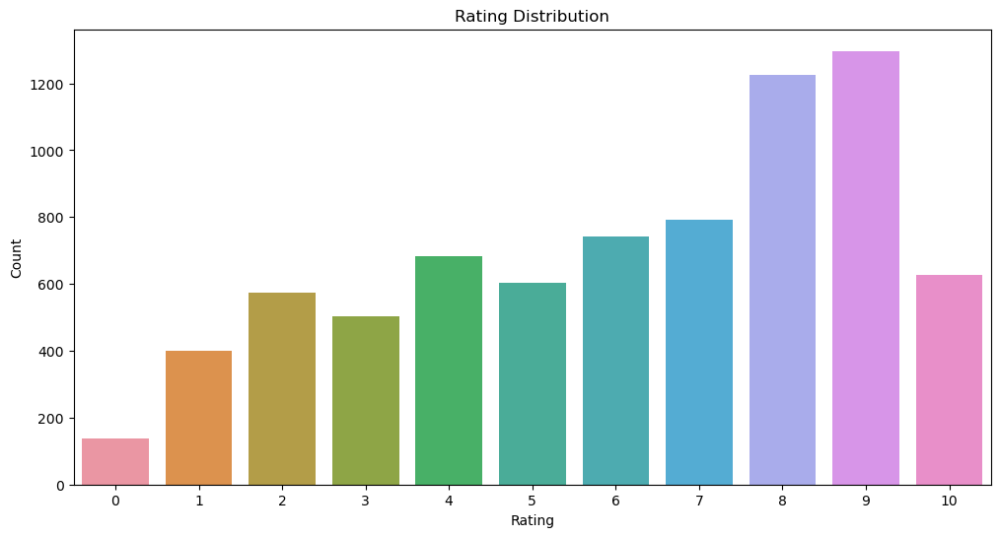

In [15]:
df['rating'] = (df['rating'] / 10).round()
df['rating'] = df['rating'].astype(int)

# Rating distribution
rating_counts = df['rating'].value_counts().reset_index()
rating_counts.columns = ['rating', 'count']  

# Plot the bar chart
plt.figure(figsize=(12, 6))
sns.barplot(data=rating_counts, x='rating', y='count')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Rating Distribution')
plt.xticks(rotation=0)
plt.show()

### Text processing: Clean the text with RegEx for description

#### Create a function to remove puncyuation,numbers, and leading/trailing whitespace

In [16]:
def preprocess_text(text):
    if isinstance(text, float):
        return ""
    text = text.lower()  # lowercase
    text = re.sub(r'[^\w\s]', '', text)  # remove punctuation
    text = re.sub(r'\d+', '', text)  # remove numbers
    text = text.strip()  # remove leading/trailing whitespace
    return text

df['description']= df['description'].apply(preprocess_text)
df.head(10)

,review_id,title,description,genres,review_content,rating
0,m/0814255,Percy Jackson & the Olympians: The Lightning T...,always troubleprone the life of teenager percy...,"Action & Adventure, Comedy, Drama, Science Fic...",A fantasy adventure that fuses Greek mythology...,5
1,m/0878835,Please Give,kate catherine keener and her husband alex oli...,Comedy,"Uma Thurman as Medusa, the gorgon with a coiff...",9
2,m/10,10,a successful middleaged hollywood songwriter f...,"Comedy, Romance",With a top-notch cast and dazzling special eff...,7
3,m/1000013-12_angry_men,12 Angry Men (Twelve Angry Men),following the closing arguments in a murder tr...,"Classics, Drama",Whether audiences will get behind The Lightnin...,10
4,m/1000079-20000_leagues_under_the_sea,"20,000 Leagues Under The Sea",in professor pierre m aronnax paul lukas and ...,"Action & Adventure, Drama, Kids & Family",What's really lacking in The Lightning Thief i...,9
5,m/10000_bc,"10,000 B.C.",mammoth hunter dleh steven strait has long bee...,"Action & Adventure, Classics, Drama",It's more a list of ingredients than a movie-m...,1
6,m/1000121-39_steps,The 39 Steps,while on vacation in london canadian richard h...,"Action & Adventure, Classics, Mystery & Suspense",Harry Potter knockoffs don't come more transpa...,10
12,m/10002516-lost_city,The Lost City,fico fellove andy garcia an apolitical havana ...,Drama,Chris Columbus returns to his comfort zone for...,2
14,m/1000253-adams_rib,Adam's Rib,a courtroom rivalry finds its way into the hou...,"Classics, Comedy, Romance",This cast is simply too generic. None of the y...,10
15,m/10002635-bridge_of_san_luis_rey,The Bridge of San Luis Rey,during the spanish inquisition franciscan monk...,"Art House & International, Drama, Faith & Spir...","Percy Jackson may not be ""Harry Potter good,"" ...",0


# III: Movie Recommendation System Using TFIDF

-  Tokenize the review_content and convert data into matrix format using TF-IDF

### Define a TF-IDF Vectorizer

In [17]:
#Define a TF-IDF Vectorizer Object and Remove all english stopwords
tfidf = TfidfVectorizer(stop_words='english')
tfidf

TfidfVectorizer(stop_words='english')

In [18]:
#Construct the required TF-IDF matrix by applying the fit_transform method on the description feature
tfidf_matrix = tfidf.fit_transform(df['description'])

#Output the shape of tfidf_matrix
tfidf_matrix.shape

(7584, 34243)

### Compute Cosine Similarity Matrix

In [19]:
# Compute the cosine similarity matrix using linear_kerne 
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

In [20]:
# Compute the cosine similarity between all movie description
cosine_sim = cosine_similarity(tfidf_matrix, tfidf_matrix)

# Show the cosine similarity matrix (just for the 5 few movies)
print(cosine_sim[:5, :5])

[[1.         0.         0.         0.         0.        ]
 [0.         1.         0.04457952 0.00605469 0.        ]
 [0.         0.04457952 1.         0.02291568 0.02217803]
 [0.         0.00605469 0.02291568 1.         0.        ]
 [0.         0.         0.02217803 0.         1.        ]]


### Construct a reverse mapping of indices and movie titles

In [21]:
#Construct a reverse mapping of indices and movie titles
indices = pd.Series(df.index, index=df['title'])
indices

title
Percy Jackson & the Olympians: The Lightning Thief        0
Please Give                                               1
10                                                        2
12 Angry Men (Twelve Angry Men)                           3
20,000 Leagues Under The Sea                              4
                                                      ...  
Zombieland                                            17699
Zookeeper                                             17703
Zoolander                                             17704
Zoolander 2                                           17705
Zoom                                                  17706
Length: 7584, dtype: int64

### Movie Recommendation Function to retrieve the top 10 most similar movies

In [22]:
# Function that takes in movie title as input and gives recommendations 
def recommend_movies(title, cosine_sim=cosine_sim, df=df, indices=indices):
    # Obtain the index of the movie that matches the title
    idx = indices[title]

    # Get the pairwsie similarity scores of all movies with that movie
    # And convert it into a list of tuples as described above
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the movies based on the cosine similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies. Ignore the first movie, because the first movie 
    # is itself
    sim_scores = sim_scores[1:11]

    # Get the movie indices using a for loop
    movie_indices = [i[0] for i in sim_scores]

    # Return the top 10 most similar movies
    return df['title'].iloc[movie_indices]

In [23]:
#Get recommendations for Avatar
#this step will take time
recommend_movies('Avatar')

161                                       Quid Pro Quo
3930                                 A Boy and His Dog
2033                                               '71
4079                                    Brooklyn Rules
5936                                          Election
6666                                      Four Minutes
14468                                         The 24th
10235    Mea Maxima Culpa: Silence In The House Of God
14210                                  Take This Waltz
11801                           The Philadelphia Story
Name: title, dtype: object

# IV: Sentiment Analysis using TextBlob

###  Identify positives and negatives sentiment analysis of review_content

In [24]:
def get_sentiment(text):
    return TextBlob(text).sentiment.polarity

In [25]:
df['sentiment'] = df['review_content'].apply(get_sentiment)
df['sentiment_analysis'] = df['sentiment'].apply(lambda x: 'positive' if x > 0.1 else ('negative' if x < -0.1 else 'neutral'))

In [26]:
df[['review_content','rating','sentiment_analysis']]

,review_content,rating,sentiment_analysis
0,A fantasy adventure that fuses Greek mythology...,5,neutral
1,"Uma Thurman as Medusa, the gorgon with a coiff...",9,positive
2,With a top-notch cast and dazzling special eff...,7,positive
3,Whether audiences will get behind The Lightnin...,10,neutral
4,What's really lacking in The Lightning Thief i...,9,positive
...,...,...,...
17699,"It is a highly exciting, hysterical bit of mel...",9,negative
17703,Whoopee. What thrills.,1,neutral
17704,Those who enjoy a thrilling tale of mystery th...,6,positive
17705,This is a classic for good reason; it stands r...,2,positive


### Analyzing sentiment distribution based on rating

In [27]:
# Round Rating to nearest 10 and convert to integers
#df['rating'] = (df['rating'] / 10).round()
#df['rating'] = df['rating'].astype(int)

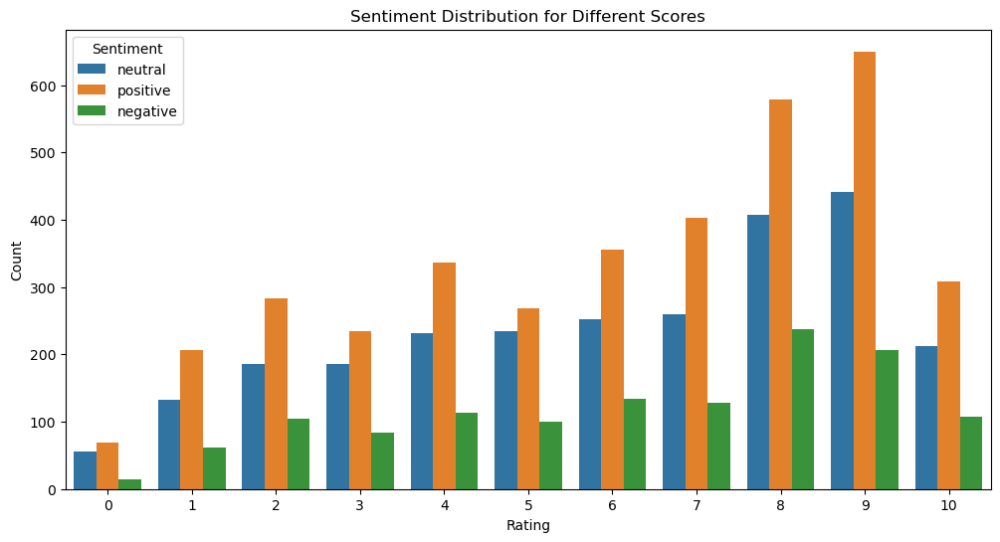

In [28]:
# plot the sentiment distribution
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='rating', hue='sentiment_analysis')
plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Sentiment Distribution for Different Scores')
plt.legend(title='Sentiment')
plt.show()

### Compare Movie_title sentiment analysis based on review_content and description

In [29]:
# Sample sentiment analysis on a movie reviews
sample_review_content = df.iloc[0]['review_content']
# Using TextBlob for sentiment analysis
blob = TextBlob(sample_review_content)
Sentiment_Review_Score = blob.sentiment.polarity  # Ranges from -1 (negative) to 1 (positive)


# Sample sentiment analysis on a movie description
sample_description = df.iloc[0]['description']
# Using TextBlob for sentiment analysis
blob = TextBlob(sample_description)
Sentiment_Description_Score = blob.sentiment.polarity  # Ranges from -1 (negative) to 1 (positive)

print(f"Sentiment_Review_Score for '{df.iloc[10]['title']}': {Sentiment_Review_Score}")
print(f"Sentiment_Description_Score '{df.iloc[10]['title']}': {Sentiment_Description_Score}")


Sentiment_Review_Score for 'Criminal': 0.041666666666666664
Sentiment_Description_Score 'Criminal': -0.25


### Extract negative reviews

In [30]:
# preprocess text data in negative reviews
def preprocess_text_data(text):
    tokens = [token for token in text.lower().split() if token.isalnum()] # tokenize text and remove stopwords
    return tokens

texts = [preprocess_text(text) for text in df[df['sentiment_analysis']=='negative']['review_content']]

# Print the first 5 text of the first review_content
print(texts[:5])

['admirably the movie isnt bogged down in the exposition common to first entries but at the end its a franchise searching for its voice', 'columbus directs with his usual frying pan to the head music is forever swelling majestically characters are always opening wide their eyes and mouths to gaze in wonder', 'percy jackson you are no harry potter you are not fit to walk in a hobbits wake', 'sorry mr jackson but harry potter you aint', 'lerman has a presence even with a mouth full of bad dialogue']


In [31]:
tokenized_texts = [word_tokenize(reviews) for reviews in df['review_content']]

# Print the first 10 tokens of the first review_content
print(tokenized_texts[0][:10])

['A', 'fantasy', 'adventure', 'that', 'fuses', 'Greek', 'mythology', 'to', 'contemporary', 'American']


### Analyzing negative reviews using Word cloud 

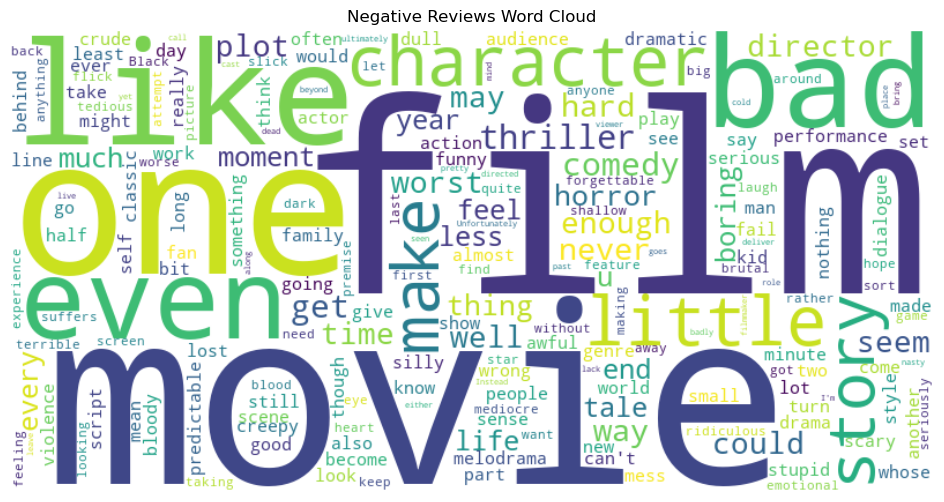

In [32]:
stopwords_set = set(stopwords.words('english'))
negative_reviews = ' '.join(df[df['sentiment_analysis'] == 'negative']['review_content'])
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=stopwords_set).generate(negative_reviews)

# Generate the word cloud
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Negative Reviews Word Cloud')
plt.show()

# V:Topic modeling Using LDA Model
- Based on review_content

### Extract topics for 10 most common words for each of the 20 topics

In [33]:
from sklearn.decomposition import LatentDirichletAllocation

In [34]:
#Use TF-IDF Vectorization to create a vectorized document term matrix.
tfidf = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
dtm = tfidf.fit_transform(df['review_content'].tolist())

# build LDA model
LDA = LatentDirichletAllocation(n_components=20,random_state=42)
LDA.fit(dtm)

LatentDirichletAllocation(n_components=20, random_state=42)

In [35]:
for index,topic in enumerate(LDA.components_):
    print(f'THE TOP 10 WORDS FOR TOPIC #{index}')
    print([tfidf.get_feature_names_out()[i] for i in topic.argsort()[-10:]])
    print('\n')

THE TOP 10 WORDS FOR TOPIC #0
['best', 'war', 'amazing', 'like', 'lost', 'director', 'good', 'just', 'film', 'movie']


THE TOP 10 WORDS FOR TOPIC #1
['thriller', 'characters', 'moments', 'make', 'rate', 'story', 'time', 'like', 'good', 'film']


THE TOP 10 WORDS FOR TOPIC #2
['provides', 'good', 'entertainment', 'harris', 'cute', 'comedy', 'movie', 'just', 'funny', 'film']


THE TOP 10 WORDS FOR TOPIC #3
['comedy', 'story', 'satisfying', 'fun', 'characters', 'entertaining', 'movie', 'film', 'happens', 'vegas']


THE TOP 10 WORDS FOR TOPIC #4
['3d', 'tragedy', 'jenkins', 'worthy', 'parental', 'content', 'legacy', 'review', 'tron', 'film']


THE TOP 10 WORDS FOR TOPIC #5
['just', 'review', 'click', 'little', 'like', 'comedy', 'good', 'film', 'movie', 'bad']


THE TOP 10 WORDS FOR TOPIC #6
['sci', 'movies', 'year', 'films', 'enemies', 'public', 'really', 'film', 'movie', 'like']


THE TOP 10 WORDS FOR TOPIC #7
['add', 'way', 'lies', 'like', 'plot', 'action', 'movie', 'season', 'witch', '

In [36]:
topic_results = LDA.transform(dtm)

In [37]:
topic_results.argmax(axis=1)

array([ 6, 19,  8, ...,  5,  0, 14], dtype=int64)

In [38]:
#show highest probability for the movie to topic column
df["Topic"]=topic_results.argmax(axis=1)
df_topic =df[["title","review_content","Topic"]]
# Display the head(10)
df_topic.head(10)

,title,review_content,Topic
0,Percy Jackson & the Olympians: The Lightning T...,A fantasy adventure that fuses Greek mythology...,6
1,Please Give,"Uma Thurman as Medusa, the gorgon with a coiff...",19
2,10,With a top-notch cast and dazzling special eff...,8
3,12 Angry Men (Twelve Angry Men),Whether audiences will get behind The Lightnin...,10
4,"20,000 Leagues Under The Sea",What's really lacking in The Lightning Thief i...,5
5,"10,000 B.C.",It's more a list of ingredients than a movie-m...,6
6,The 39 Steps,Harry Potter knockoffs don't come more transpa...,15
12,The Lost City,Chris Columbus returns to his comfort zone for...,3
14,Adam's Rib,This cast is simply too generic. None of the y...,11
15,The Bridge of San Luis Rey,"Percy Jackson may not be ""Harry Potter good,"" ...",9


### Show one topics by using WordCloud 

In [39]:
#Here is the for topic 3
topic = df[df['Topic'] == 3]['review_content'].to_string()

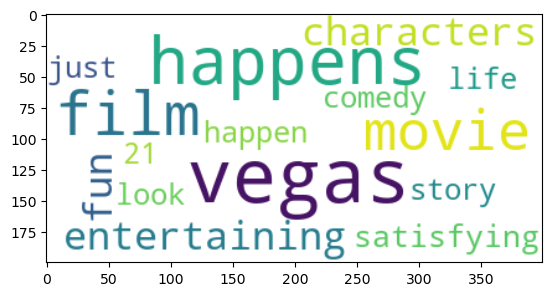

In [40]:
# use wordcloud here
# Number of terms to display in the word cloud
terms_count=15

# Get feature names from the tfidf vectorizer
terms = tfidf.get_feature_names_out()

# Get the topic 3 component
topic_3 = LDA.components_[3]

# Sort the indices of topic_3 in descending order of importance
abs_topic_argsort = np.argsort(topic_3)[::-1]

# Create a list of terms and their corresponding weights for topic 3
topic_terms_3_sorted = [[terms[i], topic_3[i]] for i in abs_topic_argsort[:terms_count]]

# Prepare a dictionary of term frequencies for word cloud generation
dict_word_frequency_3 = {}

for i in range(terms_count):
    dict_word_frequency_3[topic_terms_3_sorted[i][0]] = topic_terms_3_sorted[i][1]

# Generate the word cloud
wcloud_3 = WordCloud(background_color='white', mask = None, max_words=100, max_font_size=60, min_font_size=10, contour_width=3, contour_color='black')

wcloud_3.generate_from_frequencies(dict_word_frequency_3)

# Plot the word cloud
plt.imshow(wcloud_3, interpolation='bilinear')

# VI: Word2Vec Model 

- understanding of how different movies title, and review_id relate to one another using Word2Vec.

In [41]:
#check number of unique review_id, remove duplicate review_id
reviewers = set(df['review_id'])
reviewers = list(reviewers)
len(reviewers)

7584

In [42]:
#check number of unique review_id
customers = df["review_id"].unique().tolist()
len(reviewers)

7584

In [43]:
# Create a training list with 90% of the data
# Seed
random.seed(117)

# Training list
reviewers_train= random.sample(reviewers, (round(len(reviewers)*.9)))
print(len(reviewers_train))

# Training DF using review_id list
train_df = df[df['review_id'].isin(reviewers_train)]
test_df = df[~df['review_id'].isin(reviewers_train)]
print(len(train_df))
print(len(test_df))

6826
6826
758


### Create sequences of review_content made with reviewers in the both the train and validation sets.


In [44]:
# list to capture review_content history of the reviews
review_content_train = []

# populate the list with the title
for i in tqdm(reviewers_train):
    temp = train_df[train_df["review_id"] == i]["title"].tolist()
    review_content_train.append(temp)
    

100%|████████████████████████████████████████████████████████████████████████████| 6826/6826 [00:05<00:00, 1167.24it/s]


In [45]:
# review_content history sequence - Train
review_content_train = []

#  append the data.
for i in tqdm(reviewers_train):
    in_training = train_df[train_df['review_id'] == i]['title'].tolist()
    review_content_train.append(in_training)
    


100%|████████████████████████████████████████████████████████████████████████████| 6826/6826 [00:05<00:00, 1178.93it/s]


In [46]:
# Same process, review_content history - Test
review_content_test = []

# append the data.
for i in tqdm(test_df['review_id'].unique()):
    in_training = test_df[test_df['review_id'] == i]['title'].tolist()
    review_content_test.append(in_training)

100%|██████████████████████████████████████████████████████████████████████████████| 758/758 [00:00<00:00, 2216.38it/s]


### Build word2vec Embeddings for description

In [47]:
#text processing for description
allreviews = list(df.description)
allreviews = [i.split() for i in allreviews]

In [48]:
# Build and train Word2Vec model
model = Word2Vec(min_count=5)
model.build_vocab(allreviews)
model.train(allreviews, total_examples=model.corpus_count, epochs=10)


(3280974, 4734930)

In [49]:
print(model)

Word2Vec<vocab=9381, vector_size=100, alpha=0.025>


In [50]:
# extract all vectors
X = model.wv.index_to_key
X = model.wv.vectors

X = model.wv[model.wv.key_to_index]
X.shape

(9381, 100)

### Using the model to extract most 5 similar words from description

In [51]:
movies = train_df[["title","description"]]

# remove duplicates
movies.drop_duplicates(inplace=True, subset='title', keep="last")

# create movies-ID and movies-description dictionary
movies_dict = movies.groupby('title')['description'].apply(list).to_dict()

In [52]:
def similar_movies(v, n = 6):
    
    # extract most similar products for the input vector
    #ms = model.similar_by_vector(v, topn= n+1)[1:]
    ms = model.wv.most_similar(v, topn= n+1)[1:]
    
    # extract name and similarity score of the similar movies
    new_ms = []
    for j in ms:
        pair = (movies_dict[j[0]][0], j[1])
        new_ms.append(pair)
        
    return new_ms    

In [53]:
#Use "documentary" to find most 5 similar words
similar_movies = model.wv.most_similar('documentary', topn=5)
similar_movies

[('drama', 0.9637996554374695),
 ('animated', 0.939690887928009),
 ('classic', 0.932468056678772),
 ('thriller', 0.9268975257873535),
 ('adaptation', 0.9206558465957642)]

### Visualize word2vec Embeddings usign umap

In [54]:
title=df["title"]
rating=df["rating"]

reducer=umap.UMAP(n_neighbors=30, min_dist=0.0,
                              n_components=2, random_state=42)
result=reducer.fit_transform(X)

import random
randomlist=random.sample(range(0, len(result)),5)

plt.figure(figsize=(300,100))
plt.scatter(result[:, 0], result[:, 1], s=1000, cmap='Spectral')



for i in range(5):
    label=f"{title[i]}---{rating[i]}"
    plt.annotate(label,(result[i,0], result[i,1]), fontsize=100)

    
# Customize axis text size
plt.tick_params(axis='both', which='major', labelsize=150)  # Axis tick font size
plt.title('Movie Title using UMAP', fontsize=150)   
plt.show()

# VII: Conclusion


This project demostrates the power of NLP in finding good movie suggestions by analyzing text data, such as descriptions and user reviews content. This provides relevant movie recommendations, sentiment analysis and finding similarity. I used TF-IDF and Cosine Similarity to calculate movie similarity and create movie recommendation system. Future improvement and integrationg can be used to provide better suggestions for users as well. For example, 

Data shows that there are differences in sentiment when comparing the review_content (Sentiment for review of movie 'Criminal': 0.042) and description (Sentiment for description of movie 'Criminal': -0.25). 

This shows NLP process can be used by different organizations because review contents are critical to understand user preferences.